# Download dataset

In [1]:
!pip install kaggle
!pip install ydata_profiling
!pip install imbalanced-learn
!pip install mixed-naive-bayes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.3/399.3 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 1.9 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.2
    Uninstalling scipy-1.16.2:
      Successfully uninstalled scipy-1.16.2


In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"saatvikmtech","key":"e675c36acec415887dcabdbf052957ab"}'}

In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
!kaggle competitions download -c ait-511-course-project-1-obesity-risk
!unzip ait-511-course-project-1-obesity-risk.zip

  0% 0.00/570k [00:00<?, ?B/s]
100% 570k/570k [00:00<00:00, 774MB/s]
Archive:  ait-511-course-project-1-obesity-risk.zip
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


In [5]:
!kaggle datasets download -d aravindpcoder/obesity-or-cvd-risk-classifyregressorcluster
!unzip obesity-or-cvd-risk-classifyregressorcluster.zip

Dataset URL: https://www.kaggle.com/datasets/aravindpcoder/obesity-or-cvd-risk-classifyregressorcluster
License(s): CC-BY-SA-4.0
  0% 0.00/57.5k [00:00<?, ?B/s]
100% 57.5k/57.5k [00:00<00:00, 140MB/s]
Archive:  obesity-or-cvd-risk-classifyregressorcluster.zip
  inflating: ObesityDataSet.csv      


# EDA and Preprocessing

In [37]:
import pandas as pd
import numpy as np
import warnings
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, StandardScaler
from ydata_profiling import ProfileReport

In [38]:
original = pd.read_csv("ObesityDataSet.csv")
original

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


In [39]:
train = pd.read_csv("train.csv")
train

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,WeightCategory
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15528,15528,Male,18.000000,1.700000,50.000000,no,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,2.000000,Sometimes,Public_Transportation,Insufficient_Weight
15529,15529,Male,18.000000,1.763101,55.523481,yes,yes,2.786008,3.000000,Sometimes,no,1.962646,yes,0.028202,1.561272,Sometimes,Public_Transportation,Insufficient_Weight
15530,15530,Female,19.010211,1.686936,49.660995,no,yes,1.053534,3.452590,Sometimes,no,1.000000,no,2.001230,1.000000,Sometimes,Public_Transportation,Insufficient_Weight
15531,15531,Male,22.777890,1.805445,85.228116,yes,yes,2.000000,2.092179,Sometimes,no,2.452986,no,0.796770,0.000000,Sometimes,Public_Transportation,Overweight_Level_I


In [40]:
original.rename(columns={'NObeyesdad': 'WeightCategory'}, inplace=True)
train.drop(columns=['id'], inplace=True)
train = pd.concat([train, original]).drop_duplicates()

In [41]:
test = pd.read_csv("test.csv")
test

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,15533,Female,19.007177,1.772449,137.852618,yes,yes,3.000000,3.000000,Sometimes,no,2.007348,no,1.465931,0.813235,Sometimes,Public_Transportation
1,15534,Female,21.572114,1.698346,75.000000,yes,yes,2.000000,3.000000,Sometimes,no,2.000000,no,1.577824,1.865851,Sometimes,Public_Transportation
2,15535,Male,22.285024,1.737453,82.000000,yes,yes,2.000000,2.720642,Sometimes,no,1.830614,no,0.451009,0.000000,Sometimes,Public_Transportation
3,15536,Male,30.916426,1.775580,120.860386,yes,yes,2.712747,3.000000,Sometimes,no,2.144368,no,0.712726,0.100048,Sometimes,Automobile
4,15537,Female,18.000000,1.670000,65.000000,no,yes,2.000000,3.000000,Sometimes,no,2.000000,no,1.000000,1.000000,no,Public_Transportation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5220,20753,Male,25.137087,1.766626,114.187096,yes,yes,2.919584,3.000000,Sometimes,no,2.151809,no,1.330519,0.196680,Sometimes,Public_Transportation
5221,20754,Male,18.000000,1.710000,50.000000,no,yes,3.000000,4.000000,Frequently,no,1.000000,no,2.000000,1.000000,Sometimes,Public_Transportation
5222,20755,Male,20.101026,1.819557,105.580491,yes,yes,2.407817,3.000000,Sometimes,no,2.000000,no,1.158040,1.198439,no,Public_Transportation
5223,20756,Male,33.852953,1.700000,83.520113,yes,yes,2.671238,1.971472,Sometimes,no,2.144838,no,0.000000,0.973834,no,Automobile


## Univariate Analysis

In [42]:
original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [43]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17620 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          17620 non-null  object 
 1   Age                             17620 non-null  float64
 2   Height                          17620 non-null  float64
 3   Weight                          17620 non-null  float64
 4   family_history_with_overweight  17620 non-null  object 
 5   FAVC                            17620 non-null  object 
 6   FCVC                            17620 non-null  float64
 7   NCP                             17620 non-null  float64
 8   CAEC                            17620 non-null  object 
 9   SMOKE                           17620 non-null  object 
 10  CH2O                            17620 non-null  float64
 11  SCC                             17620 non-null  object 
 12  FAF                             17620 

In [44]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5225 entries, 0 to 5224
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              5225 non-null   int64  
 1   Gender                          5225 non-null   object 
 2   Age                             5225 non-null   float64
 3   Height                          5225 non-null   float64
 4   Weight                          5225 non-null   float64
 5   family_history_with_overweight  5225 non-null   object 
 6   FAVC                            5225 non-null   object 
 7   FCVC                            5225 non-null   float64
 8   NCP                             5225 non-null   float64
 9   CAEC                            5225 non-null   object 
 10  SMOKE                           5225 non-null   object 
 11  CH2O                            5225 non-null   float64
 12  SCC                             52

<u>**Abbreviated features meaning**</u>

FAVC: Frequent consumption of high caloric food\
FCVC: Frequency of consumption of vegetables\
NCP: Number of main meals\
CAEC: Consumption of food between meals\
SMOKE: Is a smoker\
CH20: Consumption of water daily\
CALC: Consumption of alcohol\
SCC: Calories consumption monitoring\
FAF: Physical activity frequency\
TUE: Time using technology devices\
MTRANS: Transportation used\
WeightCategory: Type of weight based on body mass index (BMI)

In [45]:
for col in train.select_dtypes(include=['object']).columns:
    print(f"\nColumn: {col}")
    print(train[col].value_counts())


Column: Gender
Gender
Male      8835
Female    8785
Name: count, dtype: int64

Column: family_history_with_overweight
family_history_with_overweight
yes    14418
no      3202
Name: count, dtype: int64

Column: FAVC
FAVC
yes    16028
no      1592
Name: count, dtype: int64

Column: CAEC
CAEC
Sometimes     14887
Frequently     2094
Always          399
no              240
Name: count, dtype: int64

Column: SMOKE
SMOKE
no     17399
yes      221
Name: count, dtype: int64

Column: SCC
SCC
no     17010
yes      610
Name: count, dtype: int64

Column: CALC
CALC
Sometimes     12665
no             4477
Frequently      477
Always            1
Name: count, dtype: int64

Column: MTRANS
MTRANS
Public_Transportation    14028
Automobile                3125
Walking                    395
Motorbike                   41
Bike                        31
Name: count, dtype: int64

Column: WeightCategory
WeightCategory
Obesity_Type_III       3307
Obesity_Type_II        2700
Normal_Weight          2627
Obesity_

In [46]:
def get_variable_types(dataframe):
    continuous_vars = []
    categorical_vars = []

    for column in dataframe.columns:
        if dataframe[column].dtype == 'object':
            categorical_vars.append(column)
        else:
            continuous_vars.append(column)

    return continuous_vars, categorical_vars

continuous_vars, categorical_vars = get_variable_types(train)

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


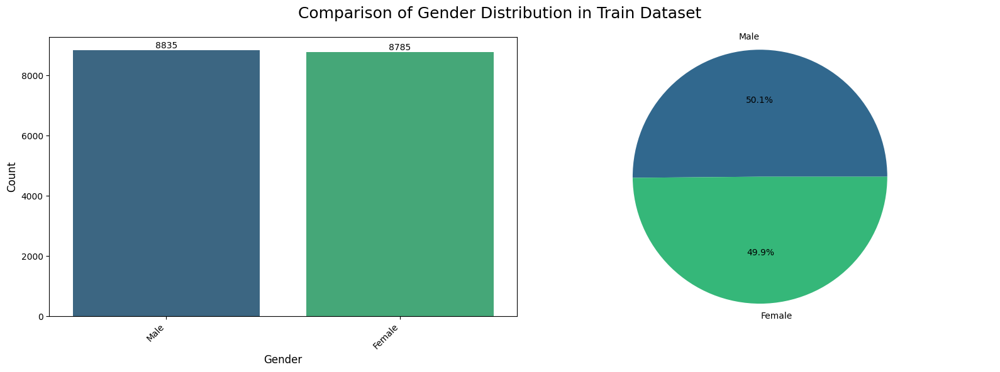

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


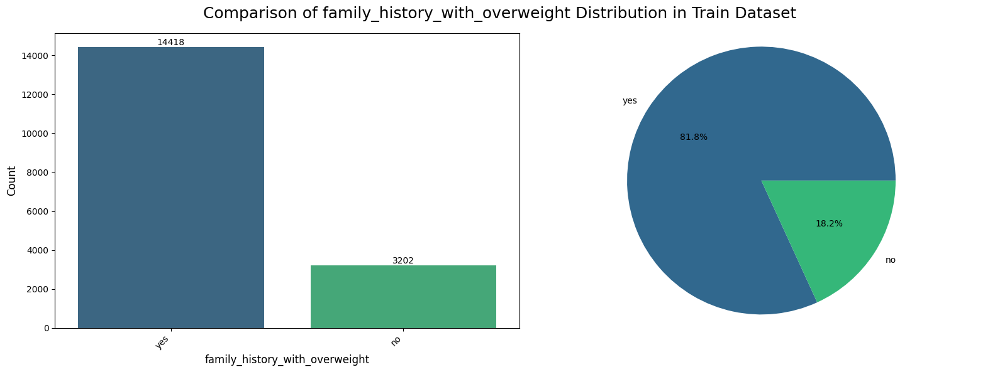

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


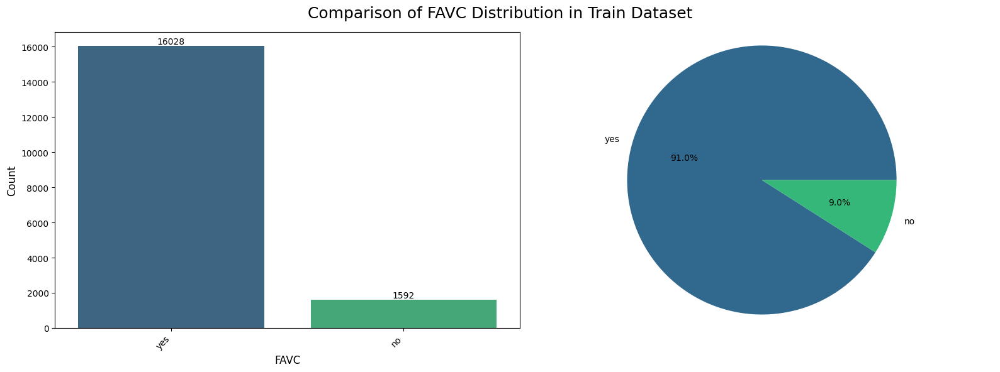

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


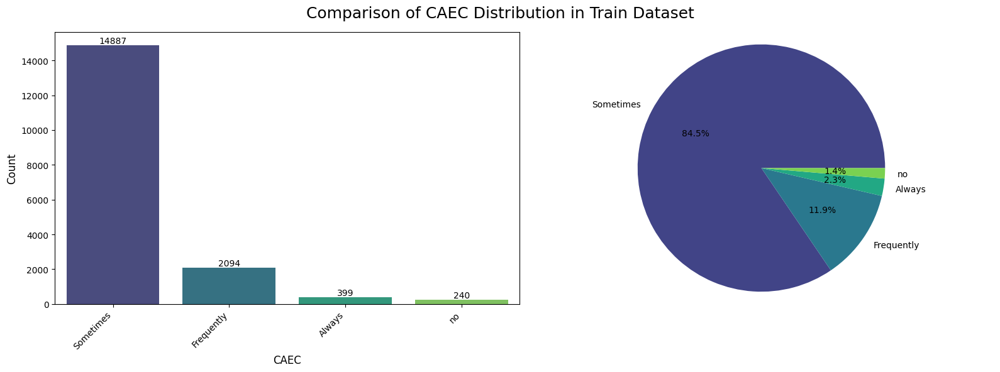

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


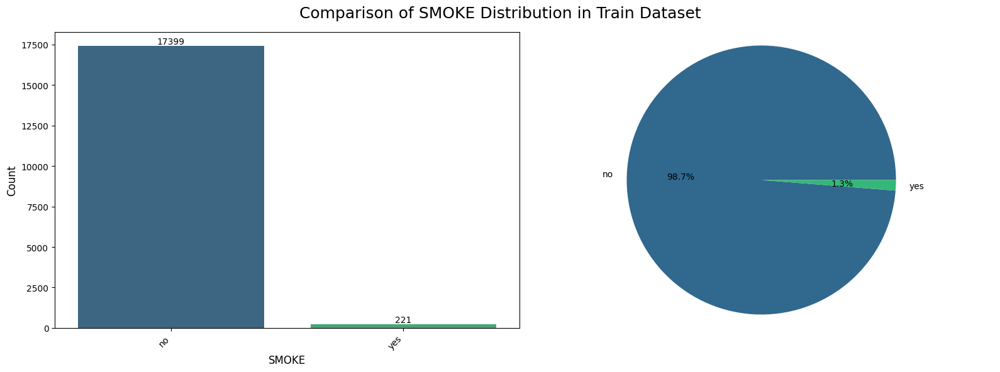

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


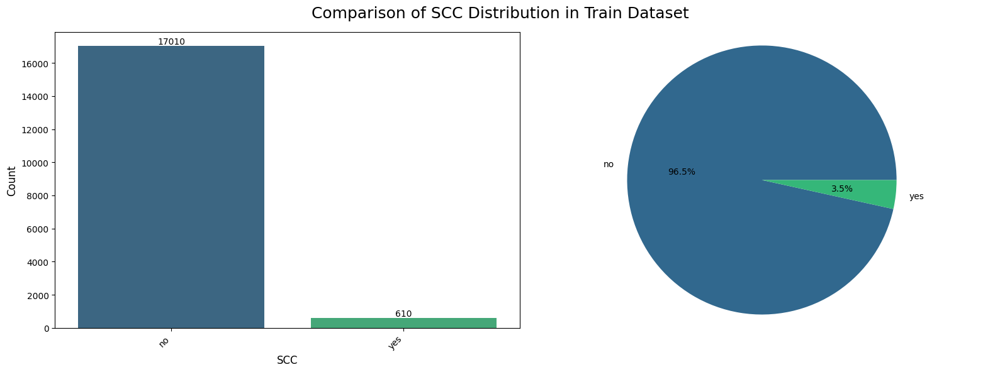

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


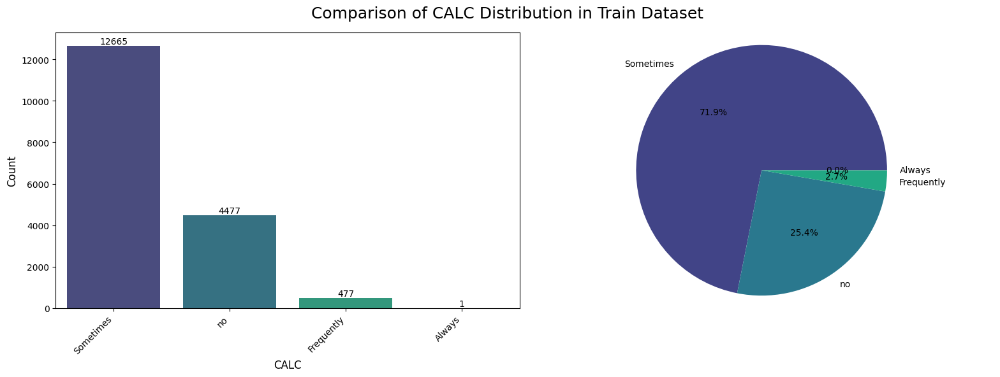

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


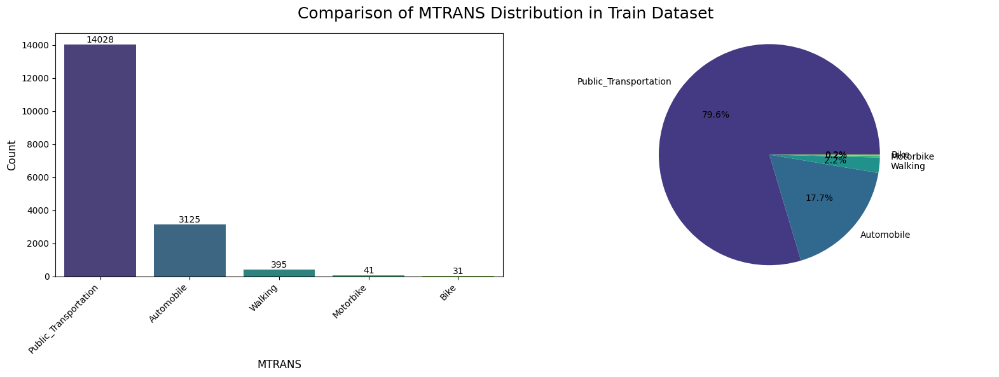

/tmp/ipython-input-3777269899.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
/tmp/ipython-input-3777269899.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)


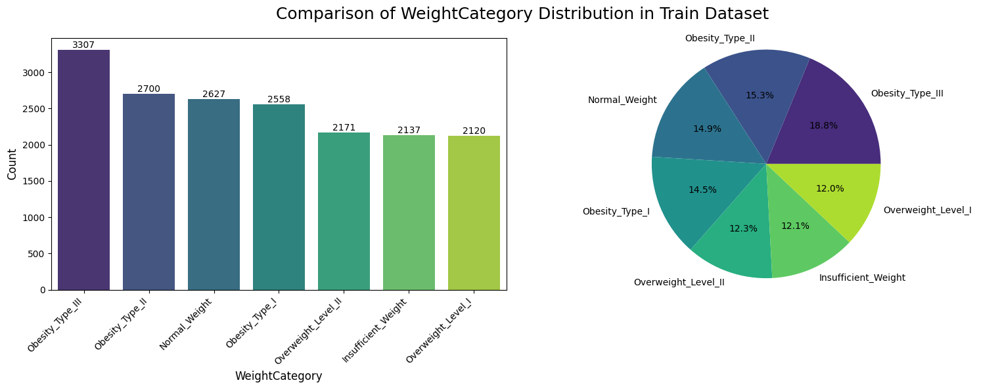

In [47]:
# Plot the distribuition of a column
def plot_distribution(df, column):
    # Calculate value counts
    value_counts = df[column].value_counts()

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # Bar plot on the first subplot
    sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
    ax1.set_xlabel(column, fontsize=12)
    ax1.set_ylabel('Count', fontsize=12)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)

    # Add data labels above each bar
    for index, value in enumerate(value_counts):
        ax1.text(index, value, str(value), ha='center', va='bottom', fontsize=10)

    # Pie plot on the second subplot
    ax2.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', colors=sns.color_palette("viridis", len(value_counts)))
    ax2.axis('equal')

    # Main title for the figure
    fig.suptitle(f'Comparison of {column} Distribution in Train Dataset', fontsize=18)

    # Adjust layout and display the figure
    plt.tight_layout()
    plt.show()

# for each categorical column plots the distribution of each value
for column in categorical_vars:
    plot_distribution(train, column)

In [48]:
output_order = ['Insufficient_Weight', 'Normal_Weight', 'Overweight_Level_I', 'Overweight_Level_II', 'Obesity_Type_I', 'Obesity_Type_II', 'Obesity_Type_III']
palette = sns.color_palette("tab10", n_colors=len(output_order))
custom_palette = dict(zip(output_order, palette))
df_train = train.copy()

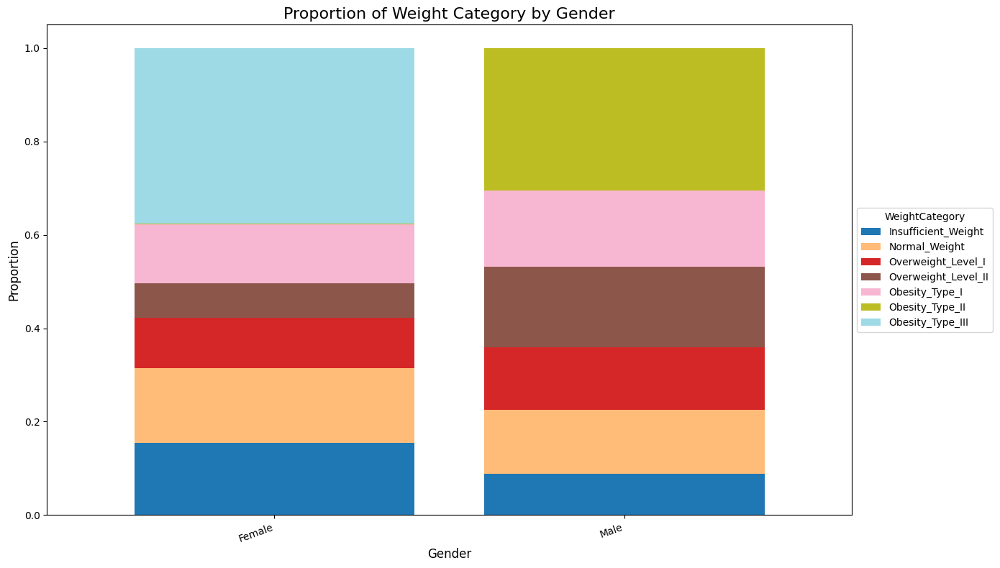

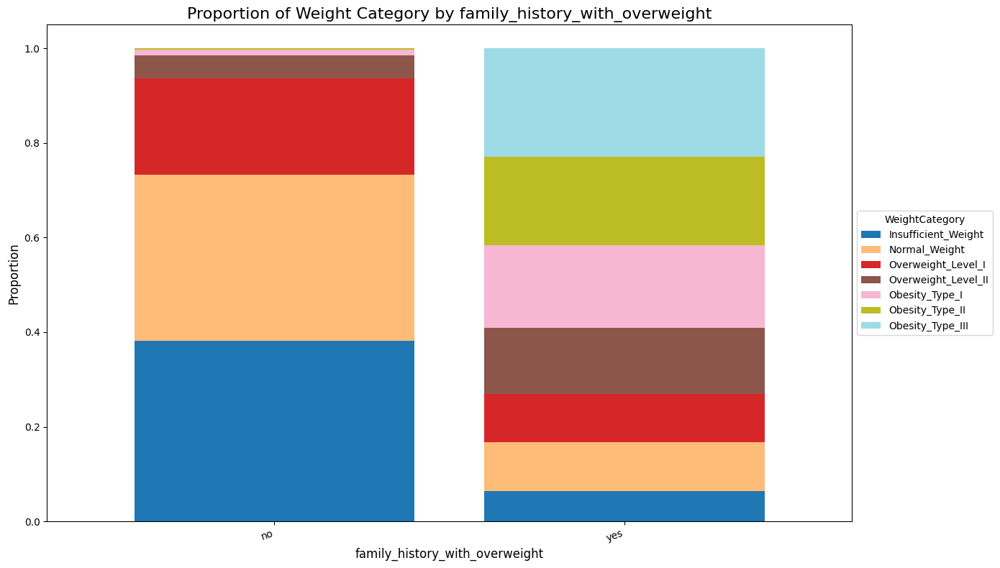

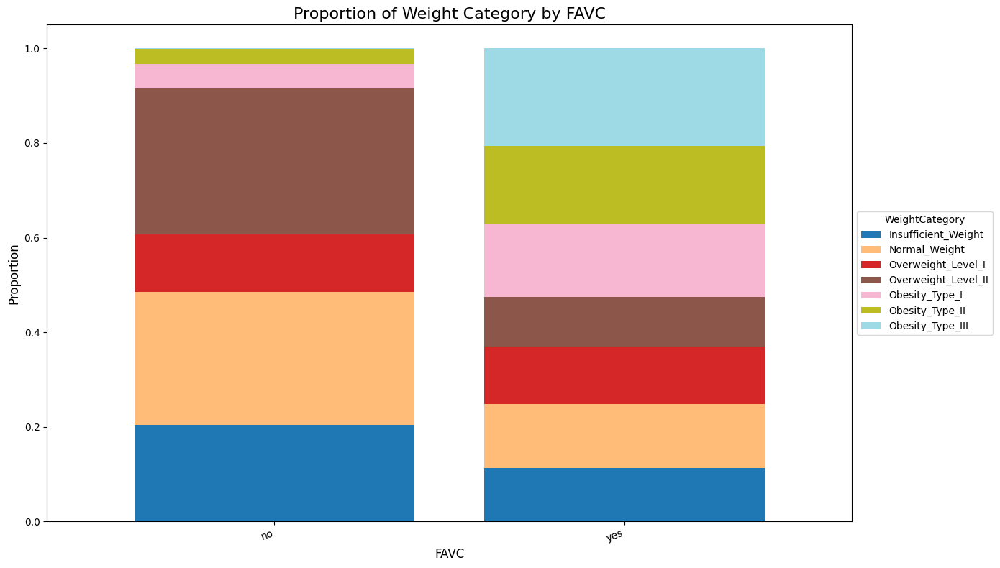

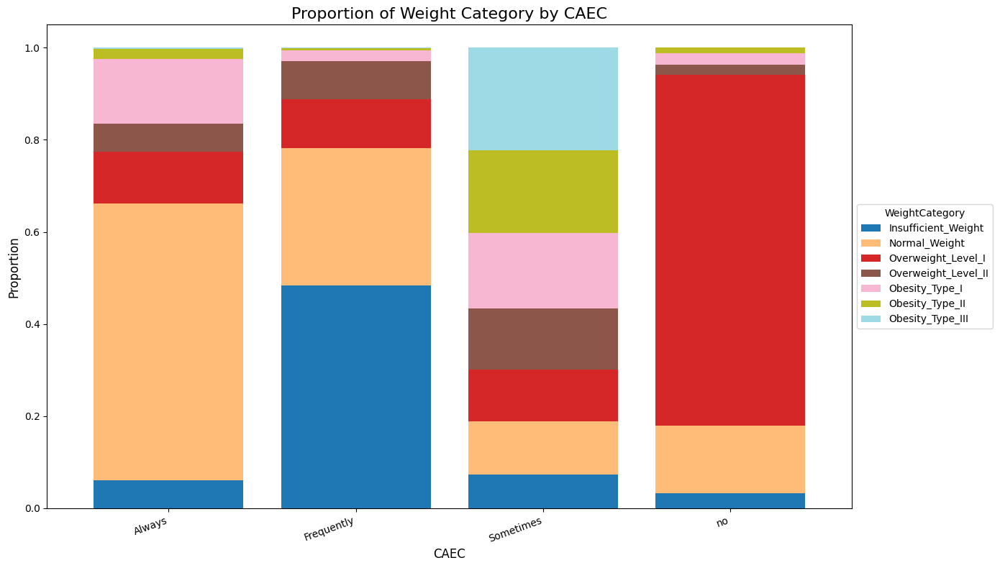

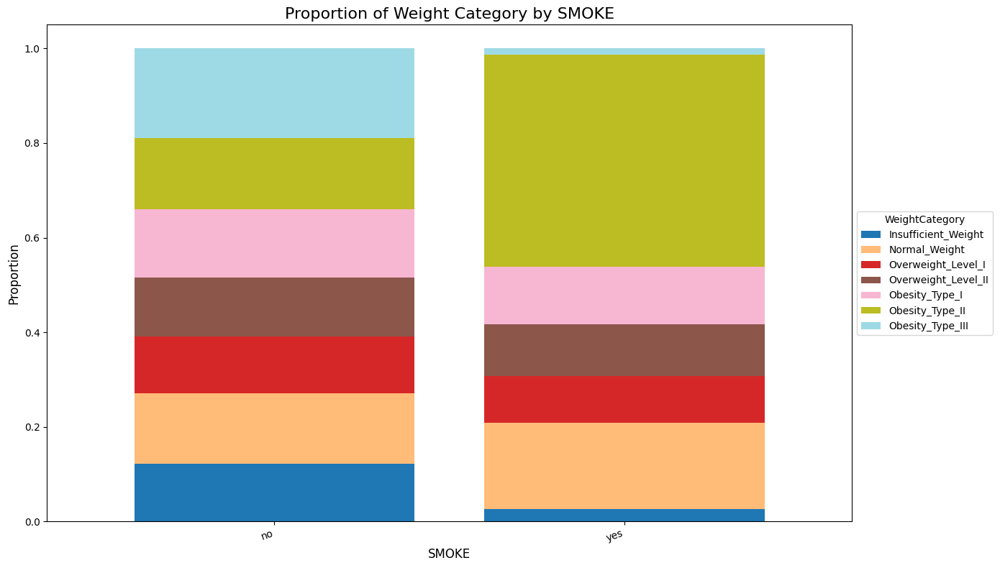

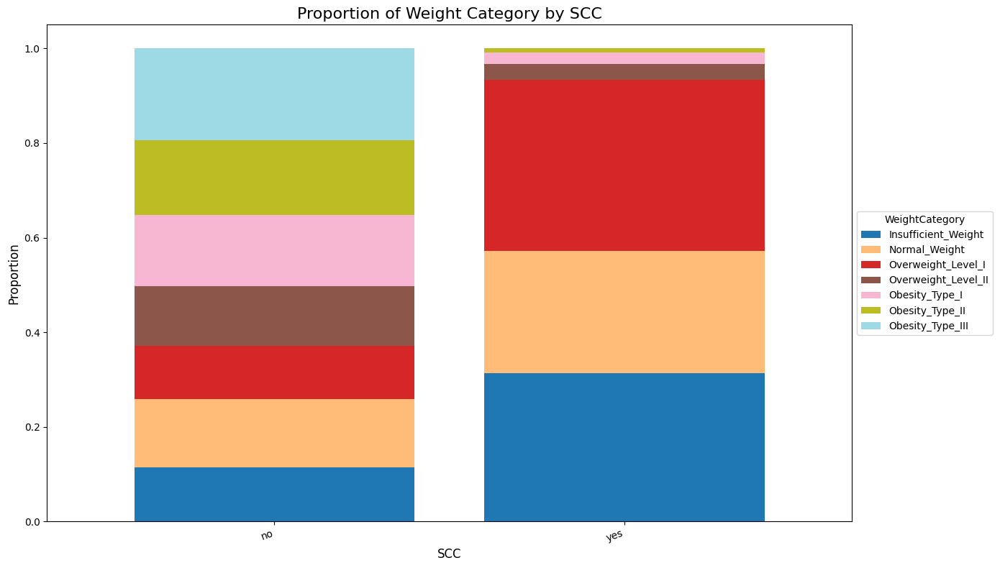

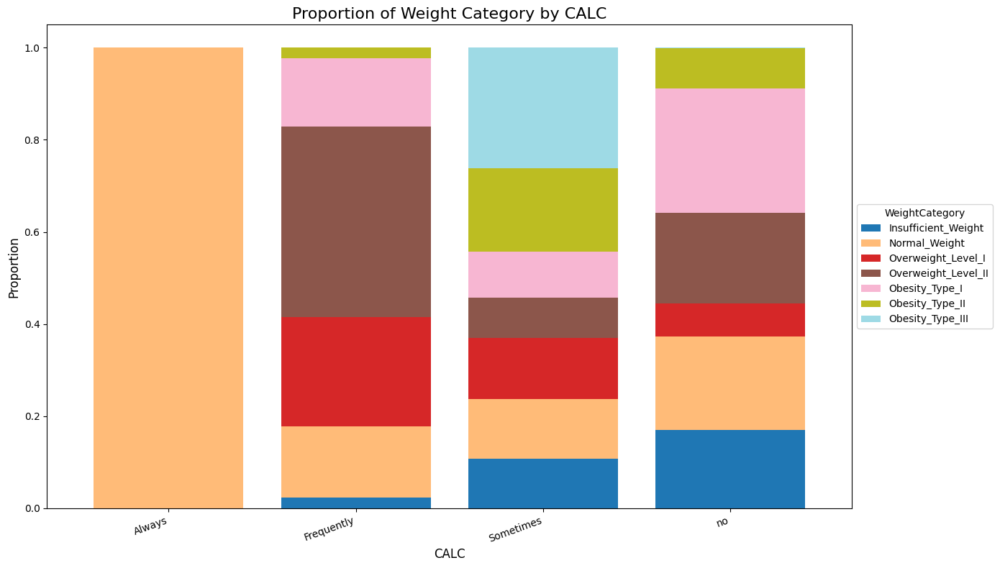

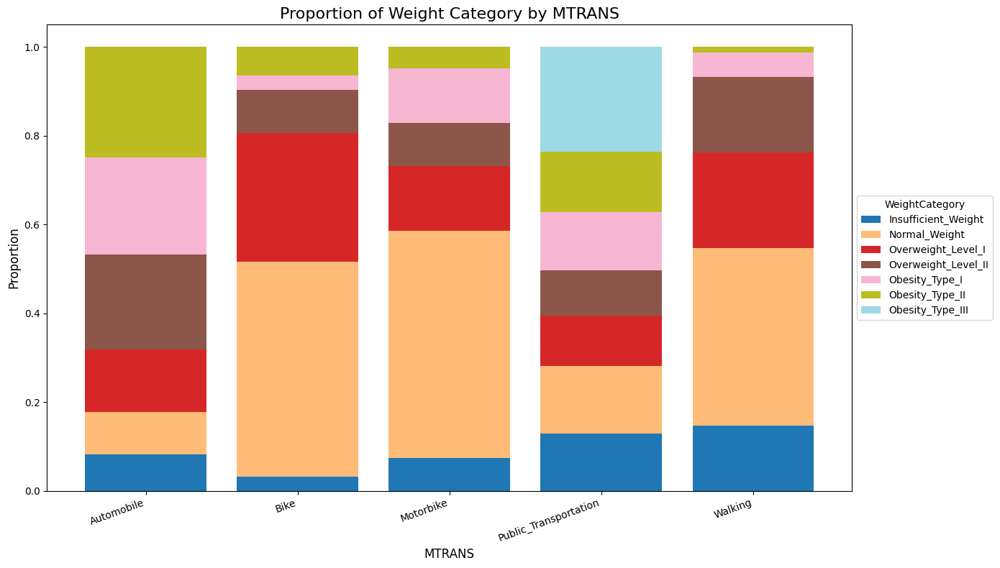

In [49]:
for cat in categorical_vars:
    if cat == 'WeightCategory':
      continue

    plt.figure(figsize=(14, 8))

    # Compute normalized proportions for each feature class
    prop_df = df_train.groupby(cat)['WeightCategory'].value_counts(normalize=True).unstack()
    prop_df = prop_df.reindex(columns=output_order)

    # Plot proportional bar chart
    prop_df.plot(
        kind='bar',
        stacked=True,
        ax=plt.gca(),
        cmap='tab20', # Use a qualitative colormap
        width=0.8
    )

    # 5. Set titles and labels
    plt.title('Proportion of Weight Category by '+cat, fontsize=16)
    plt.xlabel(cat, fontsize=12)
    plt.ylabel('Proportion', fontsize=12)
    plt.xticks(rotation=20, ha='right') # Rotate x-axis labels for readability

    # 6. Place the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), title='WeightCategory')

    # Adjust layout to prevent legend from being cut off
    plt.tight_layout()
    plt.show()

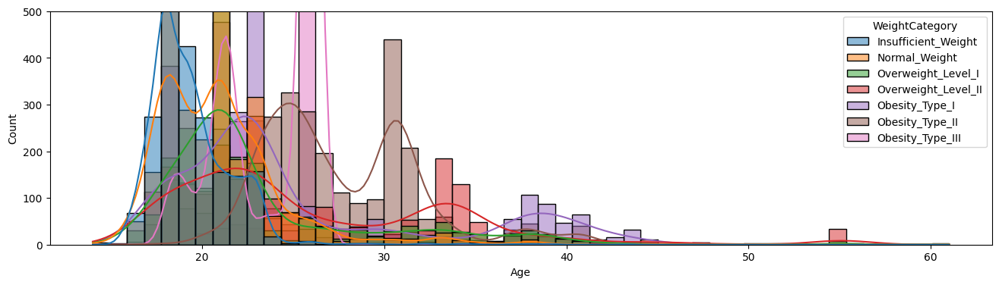

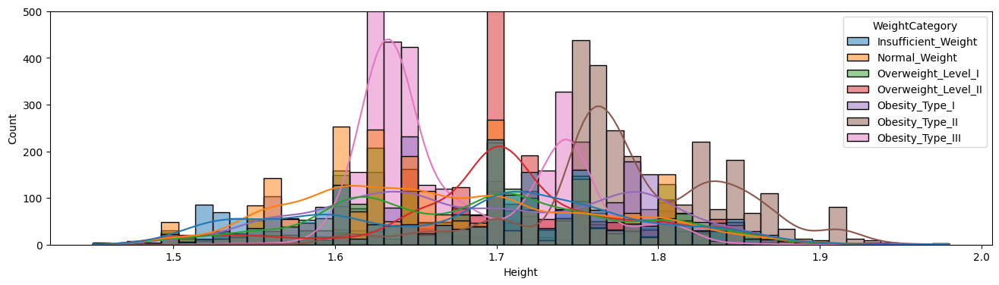

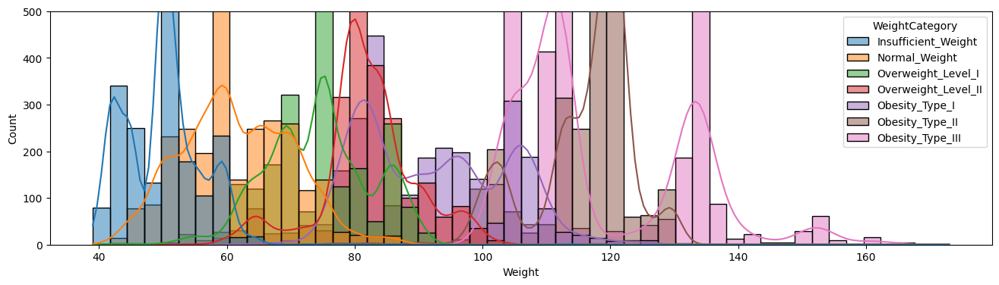

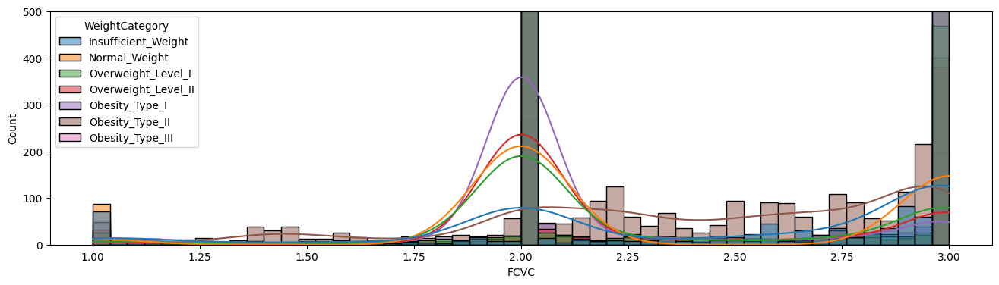

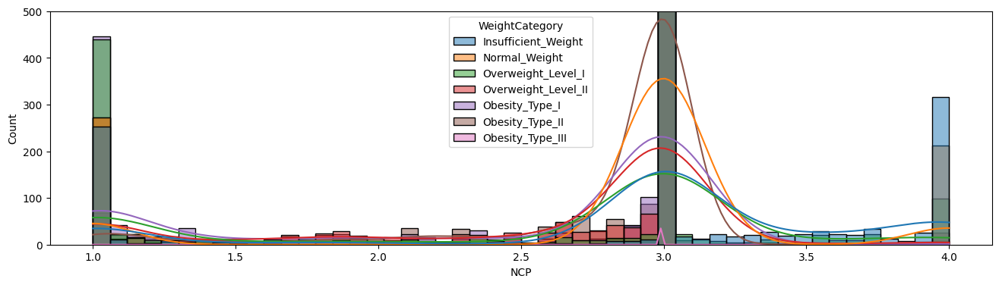

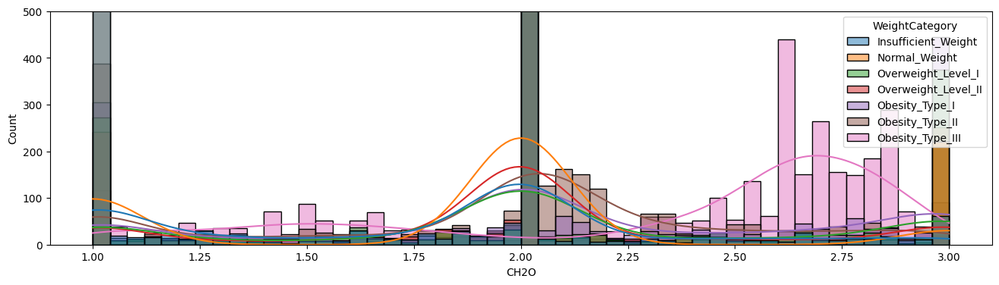

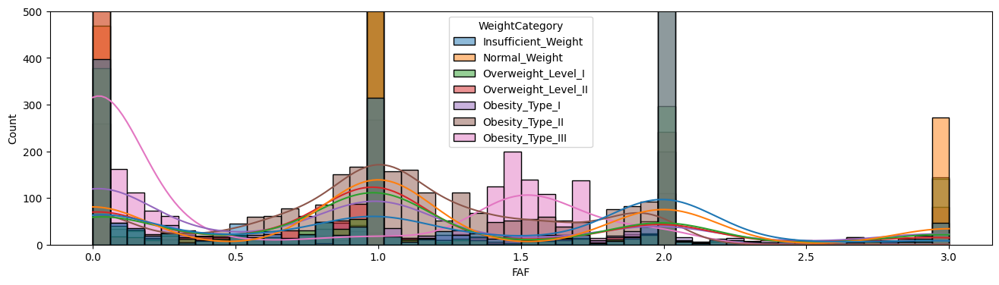

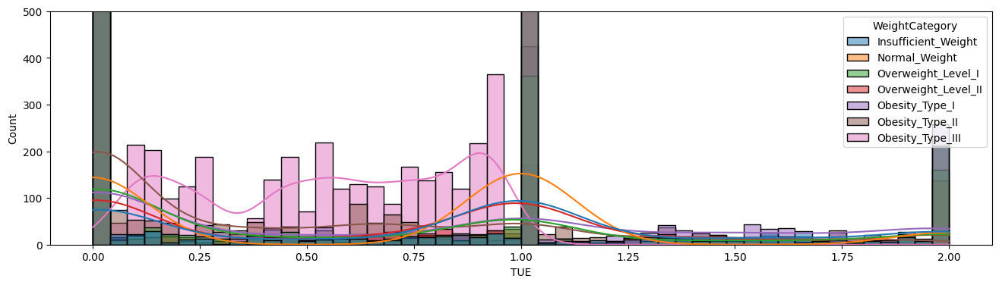

In [50]:
# Plot a histogram of a column with the amount of column for each obesity result
def plot_histograms_and_density(dataframe, column):
    fig, ax = plt.subplots(figsize=(16, 4))
    fig = sns.histplot(data=dataframe, x=column, hue="WeightCategory", hue_order=output_order, palette=custom_palette, bins=50, kde=True)
    plt.ylim(0,500)
    plt.show()

# plot the histograms of the continuous columns
for column in continuous_vars:
    plot_histograms_and_density(df_train, column)

## Bivariate Analysis

In [51]:
#Dividing Features
num_col = ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']
ord_col = ['CAEC', 'CALC']
tar_col = ['WeightCategory']
lab_col = []
for col in train.select_dtypes(include=['object']).columns:
  if col not in (ord_col + tar_col):
    lab_col.append(col)

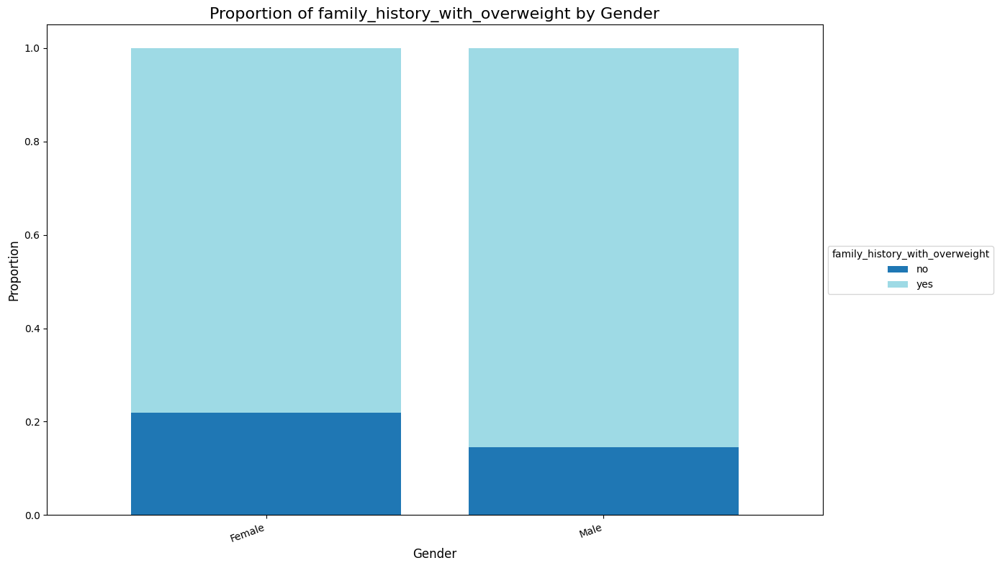

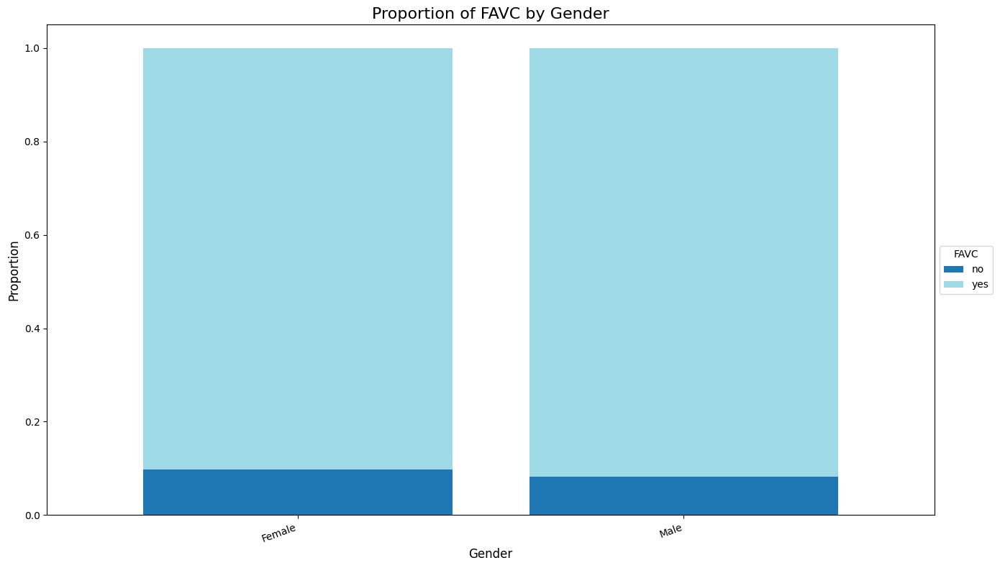

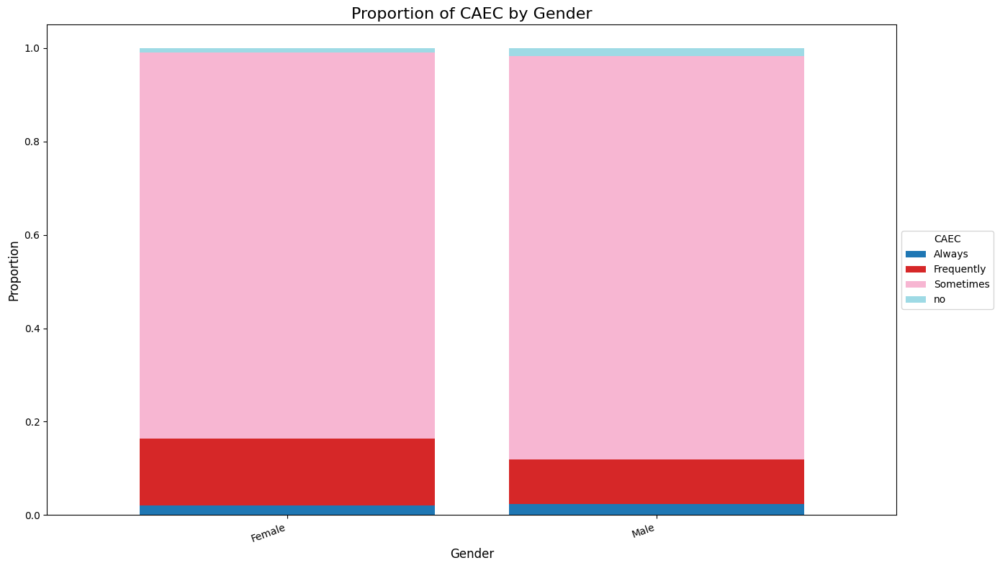

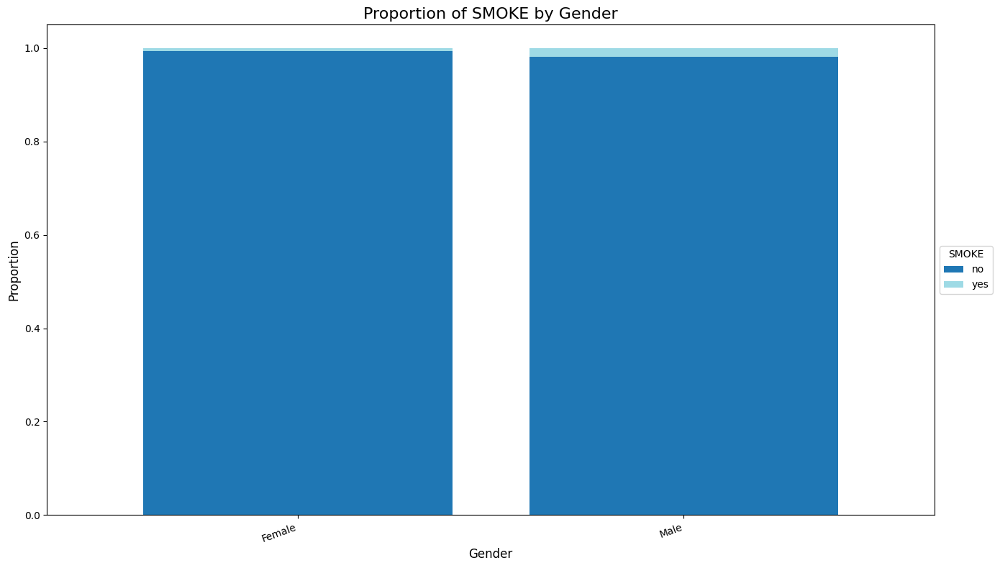

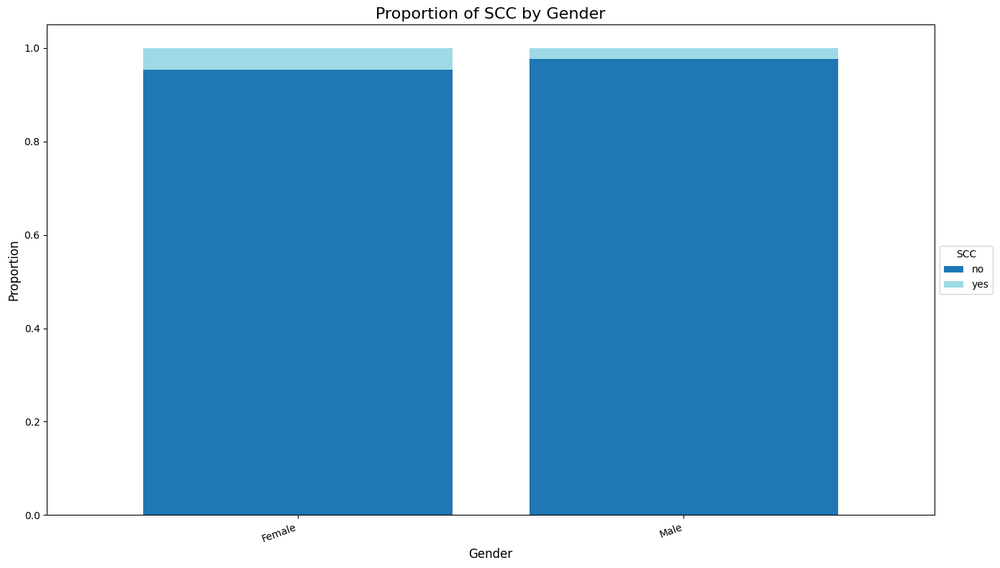

...

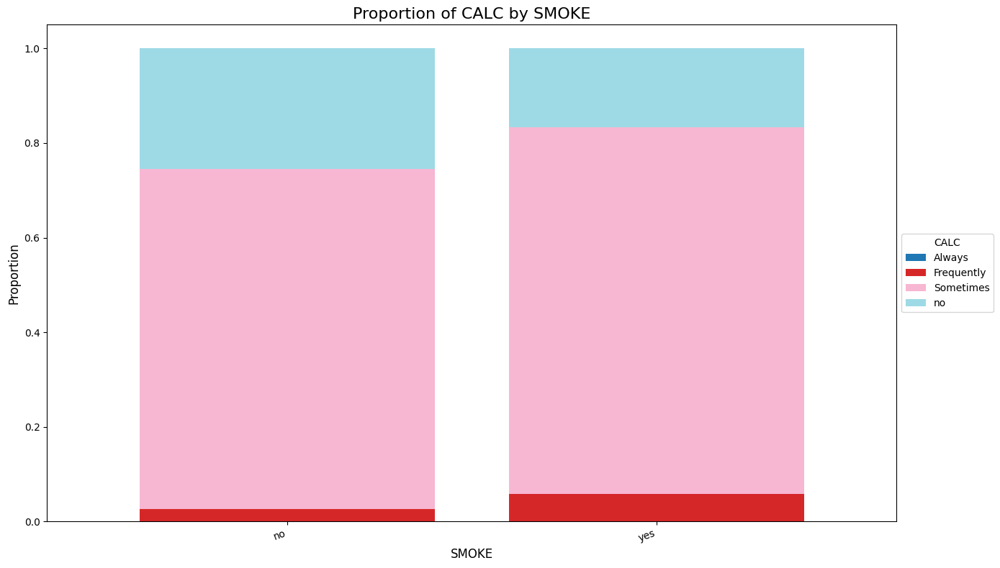

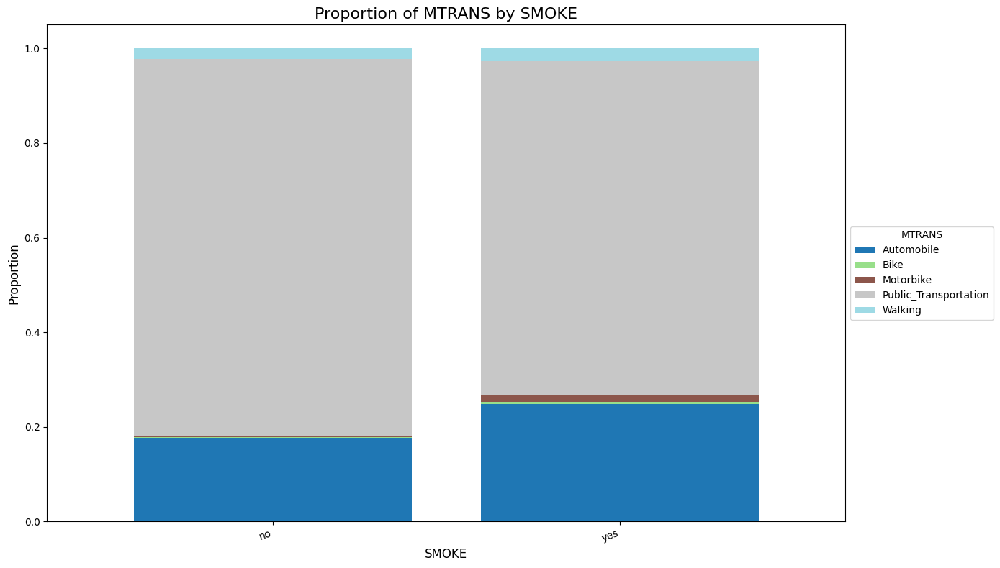

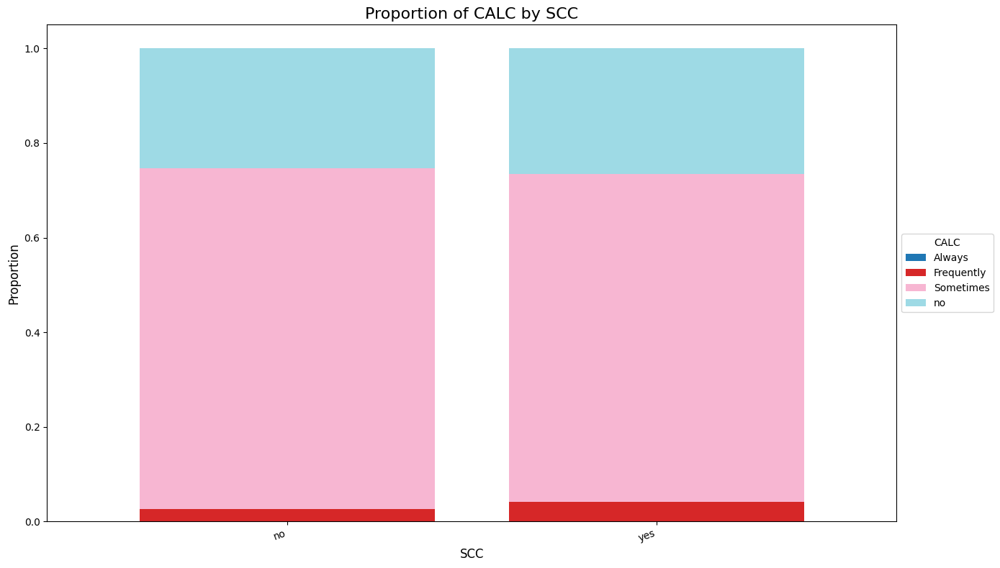

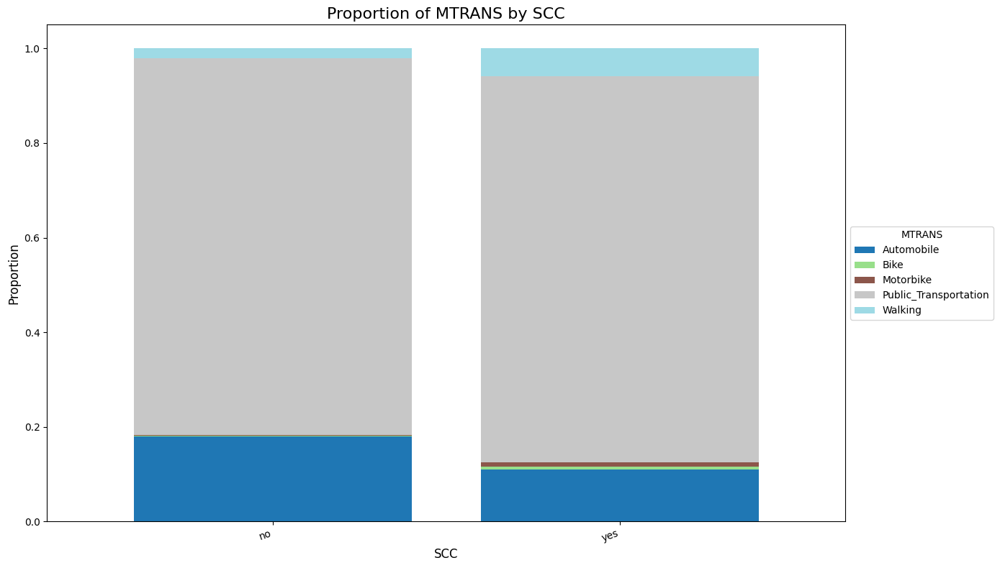

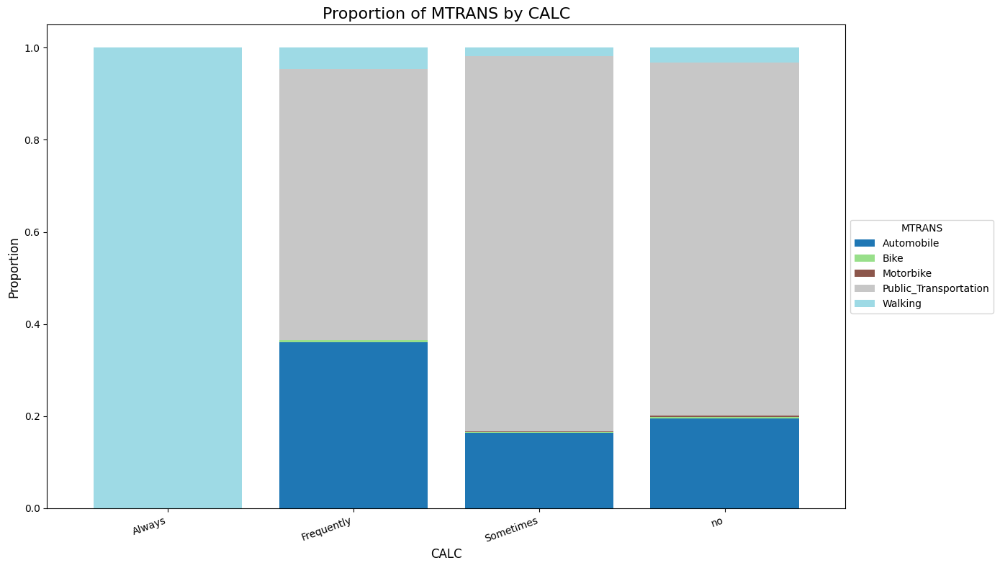

In [52]:
for i in range(len(categorical_vars)-1):
  for j in range(i+1, len(categorical_vars)-1):

    cat = categorical_vars[i]
    col = categorical_vars[j]

    plt.figure(figsize=(14, 8))

    # Compute normalized proportions for each feature class
    prop_df = df_train.groupby(cat)[col].value_counts(normalize=True).unstack()
    #prop_df = prop_df.reindex(columns=output_order)

    # Plot proportional bar chart
    prop_df.plot(
        kind='bar',
        stacked=True,
        ax=plt.gca(),
        cmap='tab20', # Use a qualitative colormap
        width=0.8
    )

    # 5. Set titles and labels
    plt.title('Proportion of '+col+' by '+cat, fontsize=16)
    plt.xlabel(cat, fontsize=12)
    plt.ylabel('Proportion', fontsize=12)
    plt.xticks(rotation=20, ha='right') # Rotate x-axis labels for readability

    # 6. Place the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), title=col)

    # Adjust layout to prevent legend from being cut off
    plt.tight_layout()
    plt.show()

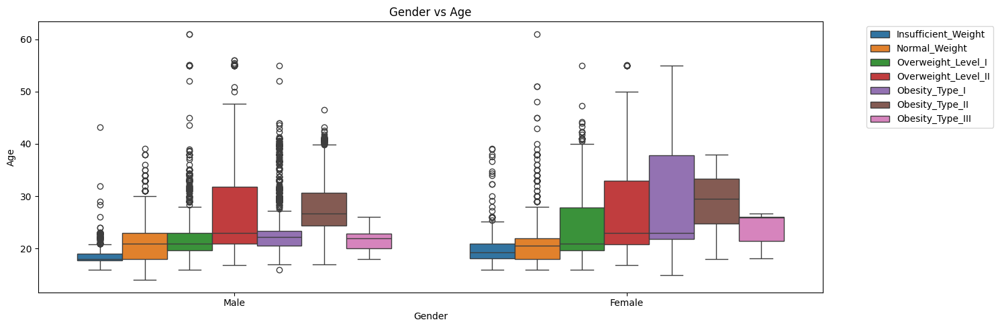

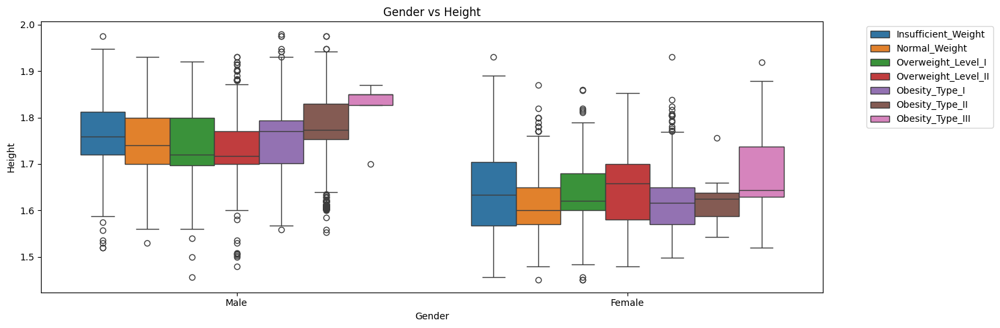

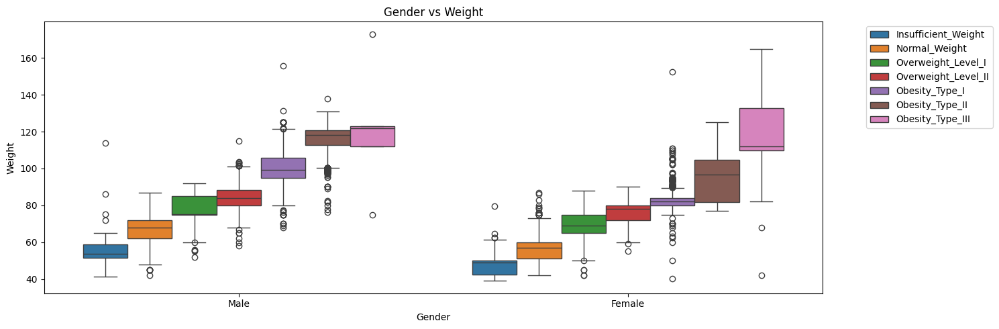

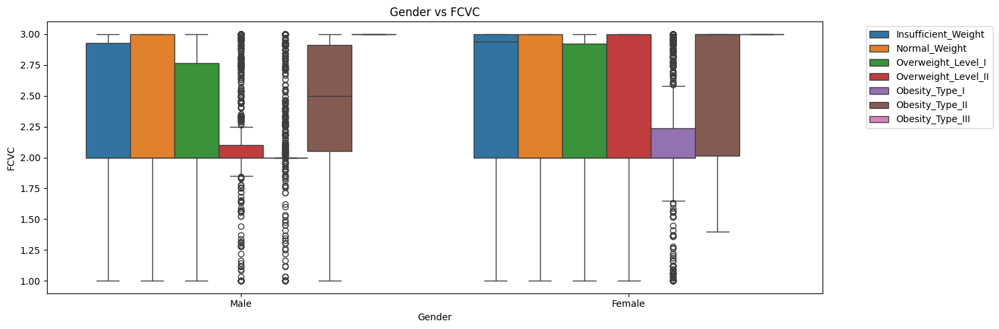

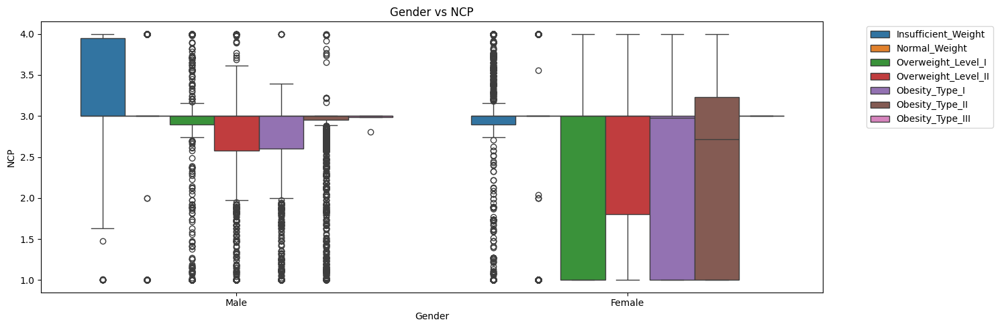

...

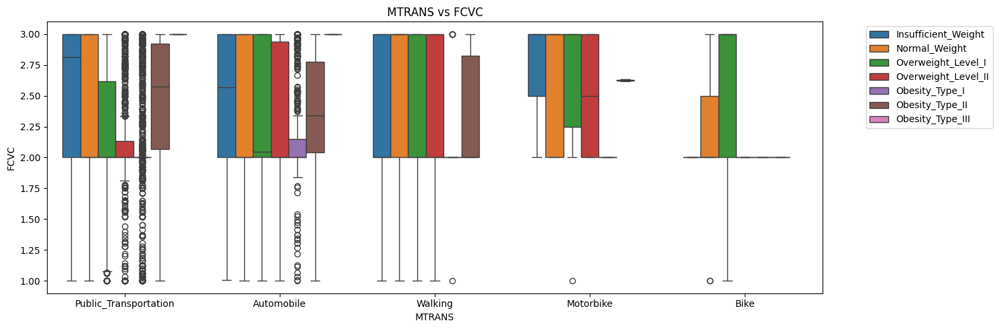

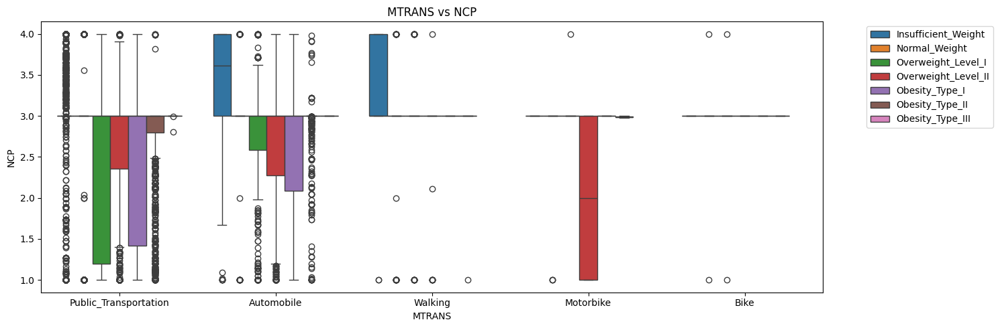

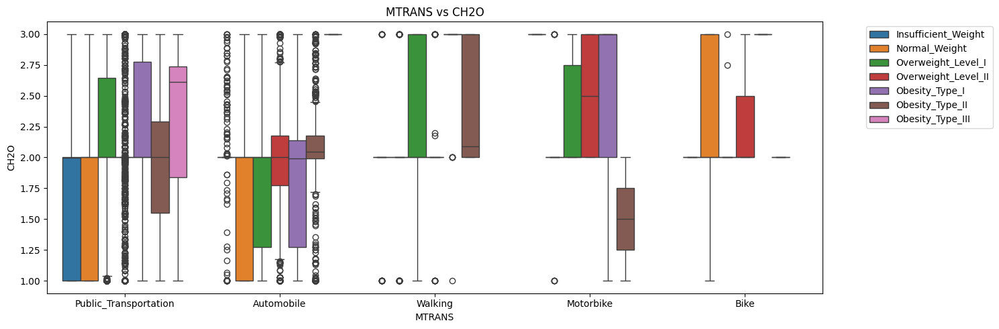

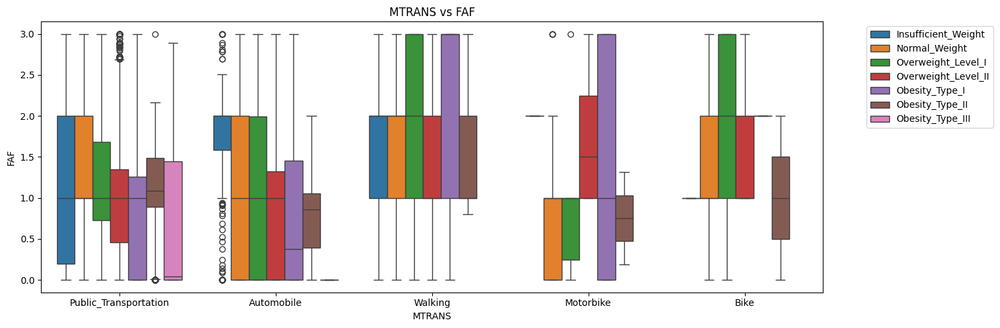

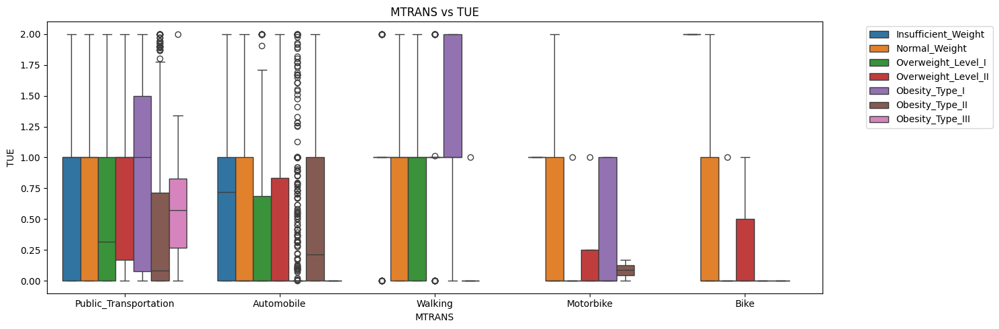

In [53]:
for cat in categorical_vars:
    for con in continuous_vars:
        if cat == 'WeightCategory':
            continue  # skip plotting against the target column

        plt.figure(figsize=(15, 5))

        sns.boxplot(
                data=train,
                x=cat,
                y=con,
                hue='WeightCategory',
                hue_order=output_order,
                palette=custom_palette
            )

        plt.title(f"{cat} vs {con}")
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

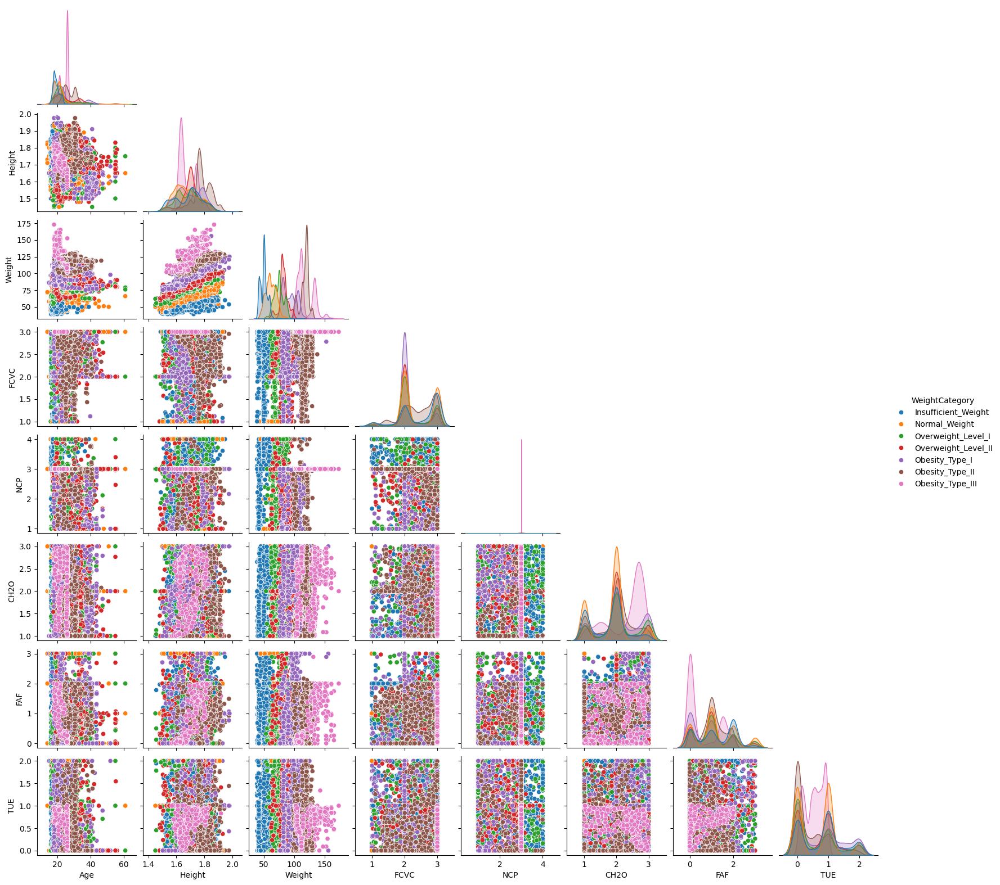

In [54]:
sns.pairplot(data=df_train, vars=num_col, hue='WeightCategory', hue_order=output_order, palette=custom_palette, corner=True, height=2)
plt.show()

## Robust PCA

In [55]:
from sklearn.decomposition import PCA
from sklearn.covariance import MinCovDet

In [56]:
df_train = train.copy()

xnum = df_train[num_col]

# Robust estimation of the covariance matrix
centrescaler = StandardScaler(with_std=False)
xnum_scaled = centrescaler.fit_transform(xnum)

# Robust covariance estimation
robust_cov = MinCovDet().fit(xnum_scaled)
V = robust_cov.covariance_

# Calculate eigenvalues and eigenvectors of the covariance matrix
values, vectors = np.linalg.eig(V)

# Sort eigenvalues in descending order
sorted_values = np.sort(values)[::-1]
sorted_indices = np.argsort(values)[::-1]
# Sort eigenvectors
sorted_vectors = vectors[:,sorted_indices]

print(sorted_values)
print(sorted_indices)
print(sorted_vectors)

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-4.635474349516904 > -69.650806554502282). You may want to try with a higher value of support_fraction (current value: 0.501).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-4.657416411176588 > -69.652050214572114). You may want to try with a higher value of support_fraction (current value: 0.501).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-4.623149591077858 > -69.651701751805959). You may want to try with a higher value of support_fraction (current value: 0.501).
  warnings.warn(
/usr/local/lib/pyth

[7.38382992e+02 1.18738095e+01 6.03439433e-01 4.68427617e-01
 3.43553662e-01 3.02949954e-01 2.20990660e-01 4.51178161e-03]
[0 1 2 4 7 6 5 3]
[[-6.65759145e-02 -9.94067490e-01 -6.52187159e-02  1.23051715e-02
   3.74565604e-02  2.23298553e-02 -3.30170988e-02  9.10752129e-04]
 [-1.33831618e-03  2.55506349e-03 -4.01869081e-02  6.12199817e-03
   2.90162670e-02  1.19179862e-02  2.08707916e-02 -9.98458633e-01]
 [-9.97733134e-01  6.63892446e-02  5.24231322e-03  2.60412075e-03
   4.72562559e-03 -6.27874977e-03  4.78232052e-03  1.47455480e-03]
 [-5.15604338e-03 -5.33481692e-04  2.56734043e-02 -1.39823579e-01
  -5.09501636e-01 -2.35320283e-01 -8.14531530e-01 -3.65267955e-02]
 [-2.76003886e-03  1.39589376e-02 -4.80545010e-01 -8.60226626e-01
  -1.46987755e-02 -5.87403876e-02  1.57964076e-01  1.62800302e-02]
 [-7.36139482e-03  1.34113801e-02 -1.08488517e-01  2.95775554e-03
  -4.02175417e-01  9.08848446e-01 -1.50382232e-02  3.27524698e-03]
 [ 1.59197654e-03  7.18623442e-02 -8.59212213e-01  4.50095317

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-4.706570130918876 > -64.716605623346837). You may want to try with a higher value of support_fraction (current value: 0.500).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-4.708678603023190 > -64.716714892378604). You may want to try with a higher value of support_fraction (current value: 0.500).
  warnings.warn(


In [57]:
print("PCs variance %")
for i in range(len(sorted_values)):
  print("PCs upto", i+1, sum(sorted_values[:i+1])/sum(sorted_values))

PCs variance %
PCs upto 1 0.9816303240502383
PCs upto 2 0.9974157519746419
PCs upto 3 0.9982179839499291
PCs upto 4 0.9988407268335656
PCs upto 5 0.9992974582268117
PCs upto 6 0.9997002097325306
PCs upto 7 0.9999940018910349
PCs upto 8 1.0


In [58]:
top2_vectors = sorted_vectors[:, :4]

# Transform data into the new 2D space (project onto eigenvectors)
pc_transformed = np.dot(xnum_scaled, top2_vectors)

# Create a DataFrame for the two PCs
pc_df = pd.DataFrame(pc_transformed, columns=['PC1', 'PC2', 'PC3', 'PC4'], index=df_train.index)

# Add PCs to original DataFrame and drop old numerical columns
df_train_new = df_train.drop(columns=num_col).join(pc_df)

# Optional: check result
print(df_train_new.head())

   Gender family_history_with_overweight FAVC        CAEC SMOKE SCC  \
0    Male                            yes  yes   Sometimes    no  no   
0    Male                            yes  yes   Sometimes    no  no   
1  Female                            yes  yes  Frequently    no  no   
1  Female                            yes  yes  Frequently    no  no   
2  Female                            yes  yes   Sometimes    no  no   

        CALC                 MTRANS       WeightCategory        PC1       PC2  \
0  Sometimes  Public_Transportation  Overweight_Level_II   5.949739 -1.000191   
0  Sometimes  Public_Transportation  Overweight_Level_II  23.814581  1.240107   
1         no             Automobile        Normal_Weight  31.000113  3.829294   
1         no             Automobile        Normal_Weight  31.786961  0.893883   
2         no  Public_Transportation  Insufficient_Weight  37.825375  3.372204   

        PC3       PC4  
0  0.612862 -0.653604  
0  0.825437 -0.763668  
1  0.127596 -0

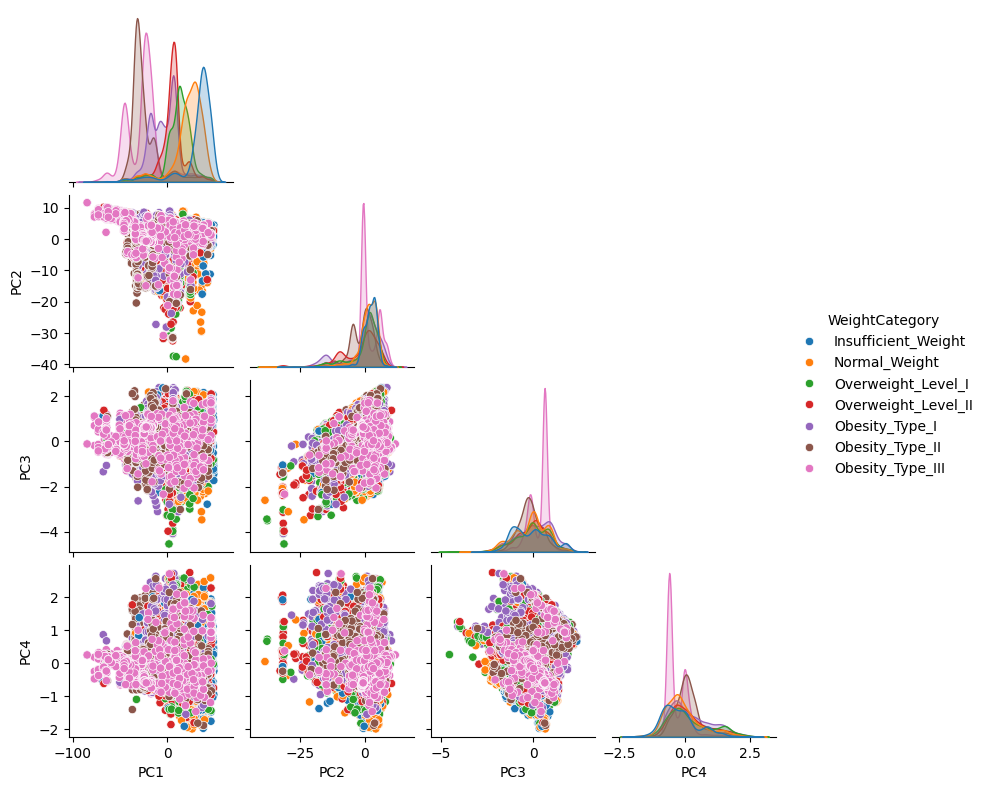

In [59]:
sns.pairplot(data=df_train_new, vars=['PC1', 'PC2', 'PC3', 'PC4'], hue='WeightCategory', hue_order=output_order, palette=custom_palette, corner=True, height=2)
plt.show()

In [60]:
df_test = test.copy()
xnum_test = df_test[num_col]

# Center test data using the training scaler
xnum_test_scaled = centrescaler.transform(xnum_test)

# Project onto the same top 2 eigenvectors
pc_test_transformed = np.dot(xnum_test_scaled, top2_vectors)

# Create a DataFrame for test PCs
pc_test_df = pd.DataFrame(pc_test_transformed, columns=['PC1', 'PC2', 'PC3', 'PC4'], index=df_test.index)

# Add PCs to test DataFrame and drop old numerical columns
df_test_new = df_test.drop(columns=num_col).join(pc_test_df)

# Optional: check result
print(df_test_new.head())

      id  Gender family_history_with_overweight FAVC       CAEC SMOKE SCC  \
0  15533  Female                            yes  yes  Sometimes    no  no   
1  15534  Female                            yes  yes  Sometimes    no  no   
2  15535    Male                            yes  yes  Sometimes    no  no   
3  15536    Male                            yes  yes  Sometimes    no  no   
4  15537  Female                             no  yes  Sometimes    no  no   

        CALC                 MTRANS        PC1       PC2       PC3       PC4  
0  Sometimes  Public_Transportation -49.741380  8.221336  0.080883 -0.038680  
1  Sometimes  Public_Transportation  12.805460  1.552763 -0.416216 -0.185381  
2  Sometimes  Public_Transportation   5.770534  1.140933  0.484549 -0.063369  
3  Sometimes             Automobile -33.582606 -4.828385 -0.239860 -0.096390  
4         no  Public_Transportation  23.018101  4.360689  0.165114 -0.347578  


In [61]:
#Label Encoding
df_train_new['MTRANS'] = np.where(df_train_new['MTRANS'].isin(['Walking', 'Bike', 'Motorbike']), 0, 1)
df_test_new['MTRANS'] = np.where(df_test_new['MTRANS'].isin(['Walking', 'Bike', 'Motorbike']), 0, 1)
for col in lab_col:
    le = LabelEncoder()
    df_train_new[col] = le.fit_transform(df_train_new[col])
    df_test_new[col] = le.transform(df_test_new[col])
le = LabelEncoder()
df_train_new['WeightCategory'] = le.fit_transform(df_train_new['WeightCategory'])

In [62]:
#Ordinal Encoding
ord_cat = [['no', 'Sometimes', 'Frequently', 'Always']]
oe = OrdinalEncoder(categories = ord_cat*2)
df_train_new[ord_col] = oe.fit_transform(df_train_new[ord_col])
df_test_new[ord_col] = oe.transform(df_test_new[ord_col])

In [63]:
df_test_new

,id,Gender,family_history_with_overweight,FAVC,CAEC,SMOKE,SCC,CALC,MTRANS,PC1,PC2,PC3,PC4
0,15533,0,1,1,1.0,0,0,1.0,1,-49.741380,8.221336,0.080883,-0.038680
1,15534,0,1,1,1.0,0,0,1.0,1,12.805460,1.552763,-0.416216,-0.185381
2,15535,1,1,1,1.0,0,0,1.0,1,5.770534,1.140933,0.484549,-0.063369
3,15536,1,1,1,1.0,0,0,1.0,1,-33.582606,-4.828385,-0.239860,-0.096390
4,15537,0,0,1,1.0,0,0,0.0,1,23.018101,4.360689,0.165114,-0.347578
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5220,20753,1,1,1,1.0,0,0,1.0,1,-26.539623,0.522182,-0.413069,0.045473
5221,20754,1,0,1,2.0,0,0,1.0,1,37.985081,3.436829,-1.120723,-0.939308
5222,20755,1,1,1,1.0,0,0,0.0,1,-17.611956,4.986353,0.131685,-0.239536
5223,20756,1,1,1,1.0,0,0,0.0,1,3.481176,-10.254372,0.579147,0.242231


In [64]:
xtrain = df_train_new.drop(columns=['WeightCategory'])
ytrain = df_train_new['WeightCategory']

xtest = df_test_new.drop(columns=['id'])

# Models

In [65]:
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier
from mixed_naive_bayes import MixedNB
from sklearn.tree import DecisionTreeClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

In [66]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

## XGBoost

In [67]:
param = {
    'n_estimators': [200],
    'learning_rate': [0.07, 0.1, 0.3],
    'max_depth': [4, 6]
}
xgb = XGBClassifier(eval_metric='mlogloss', random_state=42)
gridxgb = GridSearchCV(estimator=xgb, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridxgb.fit(xtrain, ytrain)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END learning_rate=0.07, max_depth=4, n_estimators=200;, score=(train=0.781, test=0.754) total time=   5.3s
[CV 2/5] END learning_rate=0.07, max_depth=4, n_estimators=200;, score=(train=0.785, test=0.739) total time=   2.8s
[CV 3/5] END learning_rate=0.07, max_depth=4, n_estimators=200;, score=(train=0.786, test=0.744) total time=   2.9s
[CV 4/5] END learning_rate=0.07, max_depth=4, n_estimators=200;, score=(train=0.781, test=0.751) total time=   3.1s
[CV 5/5] END learning_rate=0.07, max_depth=4, n_estimators=200;, score=(train=0.783, test=0.754) total time=   4.6s
[CV 1/5] END learning_rate=0.07, max_depth=6, n_estimators=200;, score=(train=0.837, test=0.760) total time=   4.2s
[CV 2/5] END learning_rate=0.07, max_depth=6, n_estimators=200;, score=(train=0.840, test=0.745) total time=   6.6s
[CV 3/5] END learning_rate=0.07, max_depth=6, n_estimators=200;, score=(train=0.839, test=0.750) total time=   4.2s
[CV 4/5] END

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='mlogloss', feature_types=None,
                                     feature_weights=None, gamma=None,
                                     grow...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             param_grid={'learning_rate': [0.07, 0.1, 0.3], 'max_depth': [4, 6],
                         'n_estimators': [200]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [68]:
print(gridxgb.best_score_)
print(gridxgb.best_params_)
bestxgb = gridxgb.best_estimator_
ypredtrain = bestxgb.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.7540609802152205
{'learning_rate': 0.07, 'max_depth': 6, 'n_estimators': 200}
0.8296778929980728
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      2661
           1       0.78      0.81      0.80      3248
           2       0.80      0.77      0.79      3205
           3       0.89      0.88      0.88      3306
           4       0.94      0.93      0.94      4045
           5       0.76      0.70      0.73      2638
           6       0.74      0.77      0.76      2691

    accuracy                           0.83     21794
   macro avg       0.82      0.82      0.82     21794
weighted avg       0.83      0.83      0.83     21794

[[2370  162   26   32   10   40   21]
 [ 229 2634   54   17   41  187   86]
 [  52   97 2482  162  103   94  215]
 [  54   63  129 2907    0   41  112]
 [  11   68   87    4 3748  105   22]
 [  68  230  100   59   58 1858  265]
 [  41  123  217   89   12  126 2083]]


## AdaBoost

In [ ]:
param = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.1, 0.3, 0.5, 0.7, 1]
}
ab = AdaBoostClassifier(random_state=42)
gridab = GridSearchCV(estimator=ab, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridab.fit(xtrain, ytrain)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.440, test=0.439) total time=   1.8s
[CV 2/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.439, test=0.439) total time=   1.9s
[CV 3/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.439, test=0.442) total time=   2.2s
[CV 4/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.440, test=0.440) total time=   1.7s
[CV 5/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.439, test=0.438) total time=   1.7s
[CV 1/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.445, test=0.443) total time=   3.4s
[CV 2/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.445, test=0.446) total time=   4.3s
[CV 3/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.445, test=0.448) total time=   3.4s
[CV 4/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.446, test=0.443) total time=   3.4s
[CV 5/5] END learnin

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=AdaBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.1, 0.3, 0.5, 0.7, 1],
                         'n_estimators': [100, 200, 300, 400, 500]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridab.best_score_)
print(gridab.best_params_)
bestab = gridab.best_estimator_
ypredtrain = bestab.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.6524225980799436
{'learning_rate': 0.7, 'n_estimators': 100}
0.6520311594669413
              precision    recall  f1-score   support

           0       0.66      0.63      0.64      1870
           1       0.50      0.68      0.58      2345
           2       0.47      0.49      0.48      2207
           3       0.85      0.94      0.89      2403
           4       0.87      0.73      0.80      2983
           5       0.69      0.30      0.42      1844
           6       0.56      0.69      0.62      1881

    accuracy                           0.65     15533
   macro avg       0.66      0.64      0.63     15533
weighted avg       0.67      0.65      0.65     15533

[[1172  694    0    1    0    1    2]
 [ 588 1584    4    0    0  119   50]
 [   2    9 1082  326  223   27  538]
 [   0    0   48 2247   92    0   16]
 [   1    2  741   50 2188    1    0]
 [  17  742  111    0    0  559  415]
 [   2  129  325   21    0  108 1296]]


## Random Forest

In [ ]:
param = {
    'n_estimators': [100, 200],
    'max_depth': [8, 10, 12]
}
brf = BalancedRandomForestClassifier(min_samples_leaf=2, random_state=42)
gridbrf = GridSearchCV(estimator=brf, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridbrf.fit(xtrain, ytrain)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END max_depth=8, n_estimators=100;, score=(train=0.865, test=0.835) total time=   2.3s
[CV 2/5] END max_depth=8, n_estimators=100;, score=(train=0.867, test=0.830) total time=   2.2s
[CV 3/5] END max_depth=8, n_estimators=100;, score=(train=0.866, test=0.834) total time=   2.9s
[CV 4/5] END max_depth=8, n_estimators=100;, score=(train=0.862, test=0.831) total time=   2.3s
[CV 5/5] END max_depth=8, n_estimators=100;, score=(train=0.867, test=0.842) total time=   2.2s
[CV 1/5] END max_depth=8, n_estimators=200;, score=(train=0.866, test=0.830) total time=   4.3s
[CV 2/5] END max_depth=8, n_estimators=200;, score=(train=0.867, test=0.830) total time=   5.0s
[CV 3/5] END max_depth=8, n_estimators=200;, score=(train=0.866, test=0.836) total time=   4.4s
[CV 4/5] END max_depth=8, n_estimators=200;, score=(train=0.865, test=0.832) total time=   4.6s
[CV 5/5] END max_depth=8, n_estimators=200;, score=(train=0.865, test=0.845)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=BalancedRandomForestClassifier(min_samples_leaf=2,
                                                      random_state=42),
             param_grid={'max_depth': [8, 10, 12], 'n_estimators': [100, 200]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridbrf.best_score_)
print(gridbrf.best_params_)
bestbrf = gridbrf.best_estimator_
ypredtrain = bestbrf.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.8485804130050519
{'max_depth': 12, 'n_estimators': 100}
0.9156634262537823
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      1870
           1       0.91      0.85      0.88      2345
           2       0.93      0.87      0.90      2207
           3       0.97      0.97      0.97      2403
           4       1.00      1.00      1.00      2983
           5       0.84      0.82      0.83      1844
           6       0.80      0.90      0.85      1881

    accuracy                           0.92     15533
   macro avg       0.91      0.91      0.91     15533
weighted avg       0.92      0.92      0.92     15533

[[1784   80    1    1    0    3    1]
 [ 171 1995    2    0    0  144   33]
 [   1    4 1913   51    9   45  184]
 [   0    0   38 2340    0    1   24]
 [   1    0    2    3 2974    3    0]
 [  12   98   31    0    0 1519  184]
 [   1   21   66    9    0   86 1698]]


## Decision tree

In [ ]:
param = {
    'max_depth': [5, 8, 10, 12, 15, 17, 20, 22, 25]
}
dt = DecisionTreeClassifier(min_samples_leaf=2, random_state=42)
griddt = GridSearchCV(estimator=dt, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
griddt.fit(xtrain, ytrain)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END ...max_depth=5;, score=(train=0.792, test=0.780) total time=   0.1s
[CV 2/5] END ...max_depth=5;, score=(train=0.804, test=0.795) total time=   0.1s
[CV 3/5] END ...max_depth=5;, score=(train=0.808, test=0.803) total time=   0.1s
[CV 4/5] END ...max_depth=5;, score=(train=0.810, test=0.794) total time=   0.1s
[CV 5/5] END ...max_depth=5;, score=(train=0.805, test=0.813) total time=   0.1s
[CV 1/5] END ...max_depth=8;, score=(train=0.857, test=0.816) total time=   0.1s
[CV 2/5] END ...max_depth=8;, score=(train=0.860, test=0.830) total time=   0.4s
[CV 3/5] END ...max_depth=8;, score=(train=0.857, test=0.825) total time=   0.1s
[CV 4/5] END ...max_depth=8;, score=(train=0.856, test=0.814) total time=   0.3s
[CV 5/5] END ...max_depth=8;, score=(train=0.854, test=0.834) total time=   0.2s
[CV 1/5] END ..max_depth=10;, score=(train=0.889, test=0.829) total time=   0.1s
[CV 2/5] END ..max_depth=10;, score=(train=0.890,

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=DecisionTreeClassifier(min_samples_leaf=2,
                                              random_state=42),
             param_grid={'max_depth': [5, 8, 10, 12, 15, 17, 20, 22, 25]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(griddt.best_score_)
print(griddt.best_params_)
bestdt = griddt.best_estimator_
ypredtrain = bestdt.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.8314559214585348
{'max_depth': 10}
0.8871435009334965
              precision    recall  f1-score   support

           0       0.86      0.94      0.90      1870
           1       0.84      0.78      0.81      2345
           2       0.88      0.90      0.89      2207
           3       0.98      0.97      0.97      2403
           4       1.00      1.00      1.00      2983
           5       0.78      0.75      0.76      1844
           6       0.79      0.82      0.80      1881

    accuracy                           0.89     15533
   macro avg       0.88      0.88      0.88     15533
weighted avg       0.89      0.89      0.89     15533

[[1749  115    1    1    0    3    1]
 [ 254 1835    5    0    0  194   57]
 [   2    3 1977   38    4   43  140]
 [   0    0   55 2337    0    0   11]
 [   1    0    7    1 2971    3    0]
 [  20  183   56    1    0 1377  207]
 [   3   38  152   15    0  139 1534]]


## Naive Bayes

In [ ]:
categorical_inds = [xtrain.columns.get_loc(col) for col in categorical_vars[:-1]]

nb = MixedNB(categorical_features=categorical_inds)
nb.fit(xtrain, ytrain)

MixedNB(alpha=0.5, var_smoothing=1e-09)

In [ ]:
ypredtrain = nb.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.7309598918431726
              precision    recall  f1-score   support

           0       0.72      0.81      0.76      1870
           1       0.63      0.61      0.62      2345
           2       0.61      0.59      0.60      2207
           3       0.87      0.86      0.86      2403
           4       0.96      0.99      0.98      2983
           5       0.62      0.51      0.56      1844
           6       0.55      0.60      0.58      1881

    accuracy                           0.73     15533
   macro avg       0.71      0.71      0.71     15533
weighted avg       0.73      0.73      0.73     15533

[[1508  354    0    1    0    4    3]
 [ 551 1426    6    0    2  290   70]
 [   2    5 1299  309   89   80  423]
 [   0    0  315 2076    2    0   10]
 [   1    1   10    3 2966    2    0]
 [  30  353  104    0    7  947  403]
 [   1  126  403   10   11  198 1132]]


## Ball tree

In [ ]:
param = {
    'radius': [8, 9, 10, 11, 12],
    'weights': ['uniform', 'distance']
}
rn = RadiusNeighborsClassifier()
gridrn = GridSearchCV(estimator=rn, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridrn.fit(xtrain, ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END radius=8, weights=uniform;, score=(train=0.678, test=0.687) total time=   0.4s
[CV 2/5] END radius=8, weights=uniform;, score=(train=0.679, test=0.679) total time=   0.4s
[CV 3/5] END radius=8, weights=uniform;, score=(train=0.679, test=nan) total time=   0.3s
[CV 4/5] END radius=8, weights=uniform;, score=(train=0.682, test=0.668) total time=   0.4s
[CV 5/5] END radius=8, weights=uniform;, score=(train=0.678, test=0.686) total time=   0.6s
[CV 1/5] END radius=8, weights=distance;, score=(train=1.000, test=0.723) total time=   0.4s
[CV 2/5] END radius=8, weights=distance;, score=(train=1.000, test=0.724) total time=   0.4s
[CV 3/5] END radius=8, weights=distance;, score=(train=1.000, test=nan) total time=   0.3s
[CV 4/5] END radius=8, weights=distance;, score=(train=1.000, test=0.709) total time=   0.4s
[CV 5/5] END radius=8, weights=distance;, score=(train=1.000, test=0.725) total time=   0.4s
[CV 1/5] END radiu

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RadiusNeighborsClassifier(),
             param_grid={'radius': [8, 9, 10, 11, 12],
                         'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridrn.best_score_)
print(gridrn.best_params_)
bestrn = gridrn.best_estimator_
ypredtrain = bestrn.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.7149933131903511
{'radius': 9, 'weights': 'distance'}
1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1870
           1       1.00      1.00      1.00      2345
           2       1.00      1.00      1.00      2207
           3       1.00      1.00      1.00      2403
           4       1.00      1.00      1.00      2983
           5       1.00      1.00      1.00      1844
           6       1.00      1.00      1.00      1881

    accuracy                           1.00     15533
   macro avg       1.00      1.00      1.00     15533
weighted avg       1.00      1.00      1.00     15533

[[1870    0    0    0    0    0    0]
 [   0 2345    0    0    0    0    0]
 [   0    0 2207    0    0    0    0]
 [   0    0    0 2403    0    0    0]
 [   0    0    0    0 2983    0    0]
 [   0    0    0    0    0 1844    0]
 [   0    0    0    0    0    0 1881]]


## KNN

In [ ]:
print(int(15533**0.5))

124


In [ ]:
param = {
    'n_neighbors': [31, 63, 125, 189, 251],
    'weights': ['uniform', 'distance']
}
knn = KNeighborsClassifier()
gridknn = GridSearchCV(estimator=knn, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridknn.fit(xtrain, ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END n_neighbors=31, weights=uniform;, score=(train=0.832, test=0.822) total time=   0.3s
[CV 2/5] END n_neighbors=31, weights=uniform;, score=(train=0.834, test=0.825) total time=   0.3s
[CV 3/5] END n_neighbors=31, weights=uniform;, score=(train=0.831, test=0.828) total time=   0.3s
[CV 4/5] END n_neighbors=31, weights=uniform;, score=(train=0.834, test=0.818) total time=   0.2s
[CV 5/5] END n_neighbors=31, weights=uniform;, score=(train=0.832, test=0.829) total time=   0.3s
[CV 1/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.831) total time=   0.2s
[CV 2/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.824) total time=   0.1s
[CV 3/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.834) total time=   0.2s
[CV 4/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.824) total time=   0.1s
[CV 5/5] END n_neighbors=31, weights=distance;, score

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [31, 63, 125, 189, 251],
                         'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridknn.best_score_)
print(gridknn.best_params_)
bestknn = gridknn.best_estimator_
ypredtrain = bestknn.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.8293310433972184
{'n_neighbors': 31, 'weights': 'distance'}
1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1870
           1       1.00      1.00      1.00      2345
           2       1.00      1.00      1.00      2207
           3       1.00      1.00      1.00      2403
           4       1.00      1.00      1.00      2983
           5       1.00      1.00      1.00      1844
           6       1.00      1.00      1.00      1881

    accuracy                           1.00     15533
   macro avg       1.00      1.00      1.00     15533
weighted avg       1.00      1.00      1.00     15533

[[1870    0    0    0    0    0    0]
 [   0 2345    0    0    0    0    0]
 [   0    0 2207    0    0    0    0]
 [   0    0    0 2403    0    0    0]
 [   0    0    0    0 2983    0    0]
 [   0    0    0    0    0 1844    0]
 [   0    0    0    0    0    0 1881]]
